In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
completed_data=pd.read_excel("/Users/aayushjain/codes/projects/company assignements/Snape/City Heatmap/Completed Ride Details.xlsx")
incompleted_data=pd.read_csv("/Users/aayushjain/codes/projects/company assignements/Snape/City Heatmap/dataset/Incomplete Ride Details (Historical) - Apr 15, 2024 - Apr 30, 2024.csv")
incompleted_data2=pd.read_csv("/Users/aayushjain/codes/projects/company assignements/Snape/City Heatmap/dataset/Incomplete Ride Details (Historical) - Apr 1, 2024 - Apr 14, 2024.csv")

/var/folders/q_/dn720rf91691y39h0s_hr_280000gn/T/ipykernel_98087/2564895.py:3: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  incompleted_data2=pd.read_csv("/Users/aayushjain/codes/projects/company assignements/Snape/City Heatmap/dataset/Incomplete Ride Details (Historical) - Apr 1, 2024 - Apr 14, 2024.csv")


In [3]:
completed_data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80732 entries, 0 to 80731
Data columns (total 37 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   request_made_at         80732 non-null  datetime64[ns]
 1   request_accepted_at     80732 non-null  datetime64[ns]
 2   pickup_time             80732 non-null  datetime64[ns]
 3   ride_end_at             80732 non-null  datetime64[ns]
 4   user_id                 80732 non-null  int64         
 5   ride_id                 80732 non-null  int64         
 6   user_name               80732 non-null  object        
 7   user_phone_no           80732 non-null  int64         
 8   driver_id               80732 non-null  int64         
 9   last_login              80732 non-null  datetime64[ns]
 10  vehicle_no              80732 non-null  object        
 11  city_name               80732 non-null  object        
 12  driver_name             80732 non-null  object

In [4]:
incompleted_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170642 entries, 0 to 170641
Data columns (total 12 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   user_id                  170642 non-null  int64  
 1   user_phone_no            170642 non-null  float64
 2   ride_id                  170642 non-null  object 
 3   driver_id                170642 non-null  object 
 4   name                     170642 non-null  object 
 5   driver_phone_no          170642 non-null  object 
 6   session_id               170642 non-null  int64  
 7   city_name                170642 non-null  object 
 8   request_made_at          170642 non-null  object 
 9   pickup_lat_long          170642 non-null  object 
 10  pickup_location_address  170642 non-null  object 
 11  status                   170642 non-null  object 
dtypes: float64(1), int64(2), object(9)
memory usage: 15.6+ MB


In [5]:
incompleted_data['request_made_at'].head()

0    4/23/2024 23:51
1    4/18/2024 22:49
2    4/18/2024 23:00
3    4/18/2024 23:03
4    4/18/2024 22:42
Name: request_made_at, dtype: object

In [6]:
incompleted_data['status'].unique()

array(['Missed', 'Cancelled By Driver', 'Cancelled By User'], dtype=object)

In [7]:
incompleted_data['status'].value_counts()

status
Missed                 155047
Cancelled By User       13843
Cancelled By Driver      1752
Name: count, dtype: int64

In [8]:
completed_data['user_name'].value_counts()

user_name
User                       2328
Driver                      785
P P                         120
Inderjeet Shaw              119
Bikram Singha Chowdhury      86
                           ... 
Sk Akib                       1
Nabin Halder                  1
Avishek Marjaumdar            1
Mohammad Ariz                 1
i singha                      1
Name: count, Length: 31928, dtype: int64

In [9]:
incompleted_data=incompleted_data[['user_id','driver_id','name','request_made_at','pickup_lat_long', 'status']]

In [10]:
incompleted_data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170642 entries, 0 to 170641
Data columns (total 6 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   user_id          170642 non-null  int64 
 1   driver_id        170642 non-null  object
 2   name             170642 non-null  object
 3   request_made_at  170642 non-null  object
 4   pickup_lat_long  170642 non-null  object
 5   status           170642 non-null  object
dtypes: int64(1), object(5)
memory usage: 7.8+ MB


In [11]:
completed_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80732 entries, 0 to 80731
Data columns (total 37 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   request_made_at         80732 non-null  datetime64[ns]
 1   request_accepted_at     80732 non-null  datetime64[ns]
 2   pickup_time             80732 non-null  datetime64[ns]
 3   ride_end_at             80732 non-null  datetime64[ns]
 4   user_id                 80732 non-null  int64         
 5   ride_id                 80732 non-null  int64         
 6   user_name               80732 non-null  object        
 7   user_phone_no           80732 non-null  int64         
 8   driver_id               80732 non-null  int64         
 9   last_login              80732 non-null  datetime64[ns]
 10  vehicle_no              80732 non-null  object        
 11  city_name               80732 non-null  object        
 12  driver_name             80732 non-null  object

In [12]:
completed_data=completed_data[['request_made_at','user_id','driver_id','user_name','pickup_lat_long','user_fare']]

In [13]:
completed_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80732 entries, 0 to 80731
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   request_made_at  80732 non-null  datetime64[ns]
 1   user_id          80732 non-null  int64         
 2   driver_id        80732 non-null  int64         
 3   user_name        80732 non-null  object        
 4   pickup_lat_long  80732 non-null  object        
 5   user_fare        80732 non-null  int64         
dtypes: datetime64[ns](1), int64(3), object(2)
memory usage: 3.7+ MB


In [14]:
incompleted_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170642 entries, 0 to 170641
Data columns (total 6 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   user_id          170642 non-null  int64 
 1   driver_id        170642 non-null  object
 2   name             170642 non-null  object
 3   request_made_at  170642 non-null  object
 4   pickup_lat_long  170642 non-null  object
 5   status           170642 non-null  object
dtypes: int64(1), object(5)
memory usage: 7.8+ MB


In [15]:
incompleted_data['user_name']=incompleted_data['name']

In [16]:
incompleted_data=incompleted_data.drop('name',axis=1)

In [17]:
incompleted_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170642 entries, 0 to 170641
Data columns (total 6 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   user_id          170642 non-null  int64 
 1   driver_id        170642 non-null  object
 2   request_made_at  170642 non-null  object
 3   pickup_lat_long  170642 non-null  object
 4   status           170642 non-null  object
 5   user_name        170642 non-null  object
dtypes: int64(1), object(5)
memory usage: 7.8+ MB


In [18]:
completed_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80732 entries, 0 to 80731
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   request_made_at  80732 non-null  datetime64[ns]
 1   user_id          80732 non-null  int64         
 2   driver_id        80732 non-null  int64         
 3   user_name        80732 non-null  object        
 4   pickup_lat_long  80732 non-null  object        
 5   user_fare        80732 non-null  int64         
dtypes: datetime64[ns](1), int64(3), object(2)
memory usage: 3.7+ MB


In [19]:
incompleted_data['request_made_at']

0         4/23/2024 23:51
1         4/18/2024 22:49
2         4/18/2024 23:00
3         4/18/2024 23:03
4         4/18/2024 22:42
               ...       
170637    4/22/2024 09:24
170638    4/21/2024 13:25
170639    4/22/2024 00:22
170640    4/30/2024 11:11
170641    4/21/2024 11:42
Name: request_made_at, Length: 170642, dtype: object

In [20]:
import pandas as pd

# Assuming your data is in a DataFrame named `completed_data`
# Convert the 'request_made_at' column to datetime
completed_data['request_made_at'] = pd.to_datetime(completed_data['request_made_at'])

# Verify the conversion
print(completed_data['request_made_at'].dtype)
print(completed_data['request_made_at'].head())


datetime64[ns]
0   2024-05-10 23:59:42
1   2024-05-10 23:59:42
2   2024-05-10 23:59:10
3   2024-05-10 23:58:51
4   2024-05-10 23:56:25
Name: request_made_at, dtype: datetime64[ns]


In [21]:
completed_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80732 entries, 0 to 80731
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   request_made_at  80732 non-null  datetime64[ns]
 1   user_id          80732 non-null  int64         
 2   driver_id        80732 non-null  int64         
 3   user_name        80732 non-null  object        
 4   pickup_lat_long  80732 non-null  object        
 5   user_fare        80732 non-null  int64         
dtypes: datetime64[ns](1), int64(3), object(2)
memory usage: 3.7+ MB


In [22]:
incompleted_data['request_made_at'] = pd.to_datetime(incompleted_data['request_made_at'])

# Verify the conversion
print(incompleted_data['request_made_at'].dtype)
print(incompleted_data['request_made_at'].head())

datetime64[ns]
0   2024-04-23 23:51:00
1   2024-04-18 22:49:00
2   2024-04-18 23:00:00
3   2024-04-18 23:03:00
4   2024-04-18 22:42:00
Name: request_made_at, dtype: datetime64[ns]


In [23]:
incompleted_data['user_fare'] = 0


In [24]:
completed_data['status']='completed'

In [25]:
completed_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80732 entries, 0 to 80731
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   request_made_at  80732 non-null  datetime64[ns]
 1   user_id          80732 non-null  int64         
 2   driver_id        80732 non-null  int64         
 3   user_name        80732 non-null  object        
 4   pickup_lat_long  80732 non-null  object        
 5   user_fare        80732 non-null  int64         
 6   status           80732 non-null  object        
dtypes: datetime64[ns](1), int64(3), object(3)
memory usage: 4.3+ MB


In [26]:
incompleted_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170642 entries, 0 to 170641
Data columns (total 7 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   user_id          170642 non-null  int64         
 1   driver_id        170642 non-null  object        
 2   request_made_at  170642 non-null  datetime64[ns]
 3   pickup_lat_long  170642 non-null  object        
 4   status           170642 non-null  object        
 5   user_name        170642 non-null  object        
 6   user_fare        170642 non-null  int64         
dtypes: datetime64[ns](1), int64(2), object(4)
memory usage: 9.1+ MB


In [27]:
combined_data = pd.concat([incompleted_data, completed_data], ignore_index=True)


In [28]:
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 251374 entries, 0 to 251373
Data columns (total 7 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   user_id          251374 non-null  int64         
 1   driver_id        251374 non-null  object        
 2   request_made_at  251374 non-null  datetime64[ns]
 3   pickup_lat_long  251374 non-null  object        
 4   status           251374 non-null  object        
 5   user_name        251374 non-null  object        
 6   user_fare        251374 non-null  int64         
dtypes: datetime64[ns](1), int64(2), object(4)
memory usage: 13.4+ MB


In [29]:
combined_data['user_id'].nunique()

68282

In [30]:
combined_data[combined_data['status']=='completed']['user_id'].nunique()

39191

In [31]:
combined_data=combined_data.sort_values(by='request_made_at')

In [32]:
combined_data.head()

,user_id,driver_id,request_made_at,pickup_lat_long,status,user_name,user_fare
91932,15390236,-,2024-04-15 00:00:00,"22.5868,88.4432",Missed,-,0
164783,13526154,14702706,2024-04-15 00:01:00,"22.545365,88.36172",Cancelled By User,Sarfaraz Ahmed,0
110370,14603014,-,2024-04-15 00:01:00,"22.57,88.4313",Missed,-,0
90777,14988445,-,2024-04-15 00:01:00,"22.5917,88.3587",Missed,-,0
138526,15540581,-,2024-04-15 00:01:00,"22.6426,88.4386",Missed,-,0


In [33]:
df = combined_data.sort_values(by=['user_id', 'request_made_at'])


In [34]:
def find_users_within_interval(df, interval='15T'):
    user_counts = df.groupby('user_id')['request_made_at'].apply(lambda x: (x.diff() <= pd.Timedelta(interval)).sum())
    # Filter users who have more than one entry within the interval
    users_with_multiple_entries = user_counts[user_counts > 0]
    return users_with_multiple_entries

users_with_multiple_entries = find_users_within_interval(df)

num_users = users_with_multiple_entries.shape[0]
print("Number of users with more than one entry within a 15-minute interval:", num_users)

print("User IDs with more than one entry within a 15-minute interval and their counts:")
print(users_with_multiple_entries)

total_counts = users_with_multiple_entries.sum()
print("Total number of entries within a 15-minute interval:", total_counts)

Number of users with more than one entry within a 15-minute interval: 21969
User IDs with more than one entry within a 15-minute interval and their counts:
user_id
13117245     1
13119895     3
13119902     2
13119921     1
13119997    21
            ..
15677644     1
15680703     1
15695966     1
15708555     1
15718386     1
Name: request_made_at, Length: 21969, dtype: int64
Total number of entries within a 15-minute interval: 77060


In [35]:
users_with_multiple_entries.info()

<class 'pandas.core.series.Series'>
Index: 21969 entries, 13117245 to 15718386
Series name: request_made_at
Non-Null Count  Dtype
--------------  -----
21969 non-null  int64
dtypes: int64(1)
memory usage: 343.3 KB


In [36]:
df[df['user_id']==15725073]

,user_id,driver_id,request_made_at,pickup_lat_long,status,user_name,user_fare


In [37]:
df[df['user_id']==13119921]

,user_id,driver_id,request_made_at,pickup_lat_long,status,user_name,user_fare
47528,13119921,-,2024-04-28 14:59:00,"22.5844,88.4039",Missed,-,0
47529,13119921,-,2024-04-28 15:01:00,"22.5844,88.4039",Missed,-,0
230577,13119921,13909163,2024-05-16 10:49:26,"22.584983,88.464650",completed,Sayantan Mukherjee,140


In [38]:
df[df['user_id']==13119895]

,user_id,driver_id,request_made_at,pickup_lat_long,status,user_name,user_fare
163248,13119895,13488820,2024-04-21 14:47:00,"22.645114,88.427938",Cancelled By User,Lokenath Das,0
36934,13119895,-,2024-04-21 23:12:00,"22.6005,88.4064",Missed,-,0
163249,13119895,13216705,2024-04-27 19:06:00,"22.645113,88.427932",Cancelled By User,Atin Shaw,0
37686,13119895,-,2024-04-27 19:08:00,"22.6452,88.4279",Missed,-,0
37687,13119895,-,2024-04-27 19:10:00,"22.6452,88.4279",Missed,-,0
37737,13119895,-,2024-04-27 19:15:00,"22.6451,88.4279",Missed,-,0
199812,13119895,15436658,2024-05-03 15:26:16,"22.645017,88.427837",completed,Rounak,279
185022,13119895,15554661,2024-05-07 11:49:13,"22.568732,88.433846",completed,Rounak,336


In [39]:
combined_data[combined_data['status']=='completed'].value_counts().sum()

80732

In [40]:
incompleted_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170642 entries, 0 to 170641
Data columns (total 7 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   user_id          170642 non-null  int64         
 1   driver_id        170642 non-null  object        
 2   request_made_at  170642 non-null  datetime64[ns]
 3   pickup_lat_long  170642 non-null  object        
 4   status           170642 non-null  object        
 5   user_name        170642 non-null  object        
 6   user_fare        170642 non-null  int64         
dtypes: datetime64[ns](1), int64(2), object(4)
memory usage: 9.1+ MB


In [41]:
incompleted_data2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87099 entries, 0 to 87098
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   user_id                  87099 non-null  int64 
 1   user_phone_no            87099 non-null  object
 2   ride_id                  87099 non-null  object
 3   driver_id                87099 non-null  object
 4   name                     87099 non-null  object
 5   driver_phone_no          87099 non-null  object
 6   session_id               87099 non-null  int64 
 7   city_name                87099 non-null  object
 8   request_made_at          87099 non-null  object
 9   pickup_lat_long          87099 non-null  object
 10  pickup_location_address  87099 non-null  object
 11  status                   87099 non-null  object
dtypes: int64(2), object(10)
memory usage: 8.0+ MB


In [42]:
incompleted_data2.head()

,user_id,user_phone_no,ride_id,driver_id,name,driver_phone_no,session_id,city_name,request_made_at,pickup_lat_long,pickup_location_address,status
0,13699983,+916290350647,-,-,-,-,162394729,Kolkata,2024-04-12 23:16:36,"22.5415,88.3475","Exide, 59 B, Chowringee Rd, Sreepally, Bhowani...",Missed
1,13699983,+916290350647,-,-,-,-,162394799,Kolkata,2024-04-12 23:19:14,"22.5415,88.3475","Exide, 59 B, Chowringee Rd, Sreepally, Bhowani...",Missed
2,13699983,+916290350647,-,-,-,-,162394891,Kolkata,2024-04-12 23:22:03,"22.5415,88.3475","Exide, 59 B, Chowringee Rd, Sreepally, Bhowani...",Missed
3,13403600,+919331693737,-,-,-,-,162395553,Kolkata,2024-04-12 23:48:01,"22.5865,88.3589","The Gift Gallery, Vivekananda Road, Ramgarh, G...",Missed
4,14324253,+917980397423,-,-,-,-,161930032,Kolkata,2024-04-03 23:06:36,"22.534,88.3785","Tiljala Dispensary, Tiljala Shibtala Lane, Top...",Missed


In [43]:
incompleted_data2['user_name']=incompleted_data2['name']

In [44]:
incompleted_data2['user_fare']=0

In [45]:
incompleted_data2=incompleted_data2[['user_id','driver_id','request_made_at','pickup_lat_long' ,'status','name','user_fare']]


In [46]:
incompleted_data = pd.concat([incompleted_data, incompleted_data2], ignore_index=True, sort=False)


In [47]:
incompleted_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 257741 entries, 0 to 257740
Data columns (total 8 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   user_id          257741 non-null  int64 
 1   driver_id        257741 non-null  object
 2   request_made_at  257741 non-null  object
 3   pickup_lat_long  257741 non-null  object
 4   status           257741 non-null  object
 5   user_name        170642 non-null  object
 6   user_fare        257741 non-null  int64 
 7   name             87099 non-null   object
dtypes: int64(2), object(6)
memory usage: 15.7+ MB


/Users/aayushjain/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:34: NotOpenSSLWarning: urllib3 v2.0 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


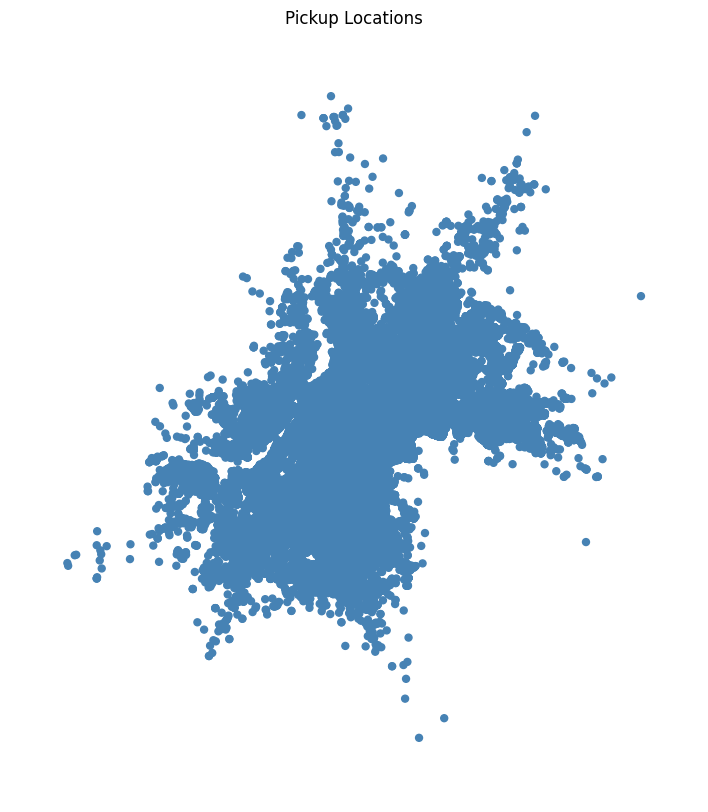

In [48]:
import geopandas as gpd
import geoplot
combined_data[['latitude', 'longitude']] = combined_data['pickup_lat_long'].str.split(',', expand=True)
combined_data['latitude'] = combined_data['latitude'].astype(float)
combined_data['longitude'] = combined_data['longitude'].astype(float)

gcombined_data_coordinates = gpd.GeoDataFrame(combined_data, geometry=gpd.points_from_xy(combined_data.longitude, combined_data.latitude))

geoplot.pointplot(gcombined_data_coordinates, figsize=(10, 10))
plt.title('Pickup Locations')
plt.show()

In [49]:
not_completed=combined_data[combined_data['status']!='completed']

In [50]:
not_completed.info()

<class 'pandas.core.frame.DataFrame'>
Index: 170642 entries, 91932 to 82162
Data columns (total 9 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   user_id          170642 non-null  int64         
 1   driver_id        170642 non-null  object        
 2   request_made_at  170642 non-null  datetime64[ns]
 3   pickup_lat_long  170642 non-null  object        
 4   status           170642 non-null  object        
 5   user_name        170642 non-null  object        
 6   user_fare        170642 non-null  int64         
 7   latitude         170642 non-null  float64       
 8   longitude        170642 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(2), object(4)
memory usage: 13.0+ MB


In [51]:
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 251374 entries, 91932 to 209859
Data columns (total 9 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   user_id          251374 non-null  int64         
 1   driver_id        251374 non-null  object        
 2   request_made_at  251374 non-null  datetime64[ns]
 3   pickup_lat_long  251374 non-null  object        
 4   status           251374 non-null  object        
 5   user_name        251374 non-null  object        
 6   user_fare        251374 non-null  int64         
 7   latitude         251374 non-null  float64       
 8   longitude        251374 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(2), object(4)
memory usage: 19.2+ MB


/Users/aayushjain/Library/Python/3.9/lib/python/site-packages/geoplot/geoplot.py:1304: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(


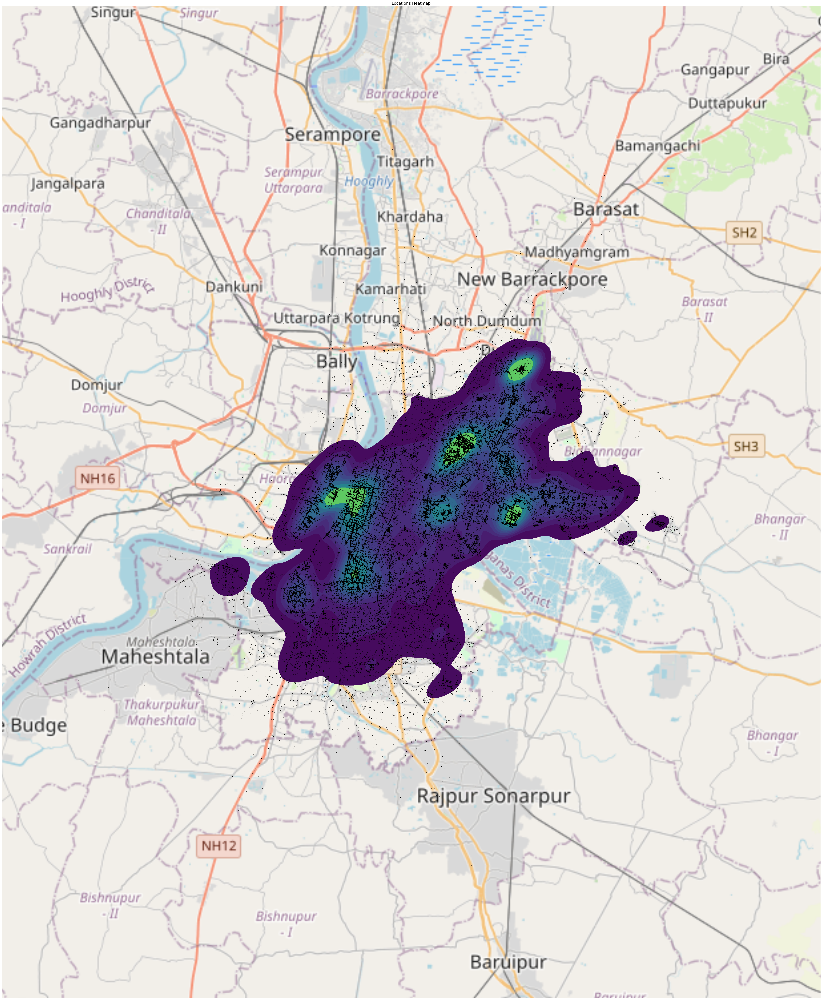

In [53]:
import geopandas as gpd
import geoplot.crs as gcrs
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geoplot as gplt

gdf = gpd.GeoDataFrame(gcombined_data_coordinates, geometry=gpd.points_from_xy(gcombined_data_coordinates.longitude, gcombined_data_coordinates.latitude))

# Plot KDE
ax = gplt.kdeplot(
    gdf, cmap='viridis', projection=gcrs.WebMercator(), figsize=(80, 80),
    shade=True
)

gplt.pointplot(gdf, s=1, color='black', ax=ax)

gplt.webmap(gdf, ax=ax)

plt.title('Locations Heatmap', fontsize=18)
plt.show()

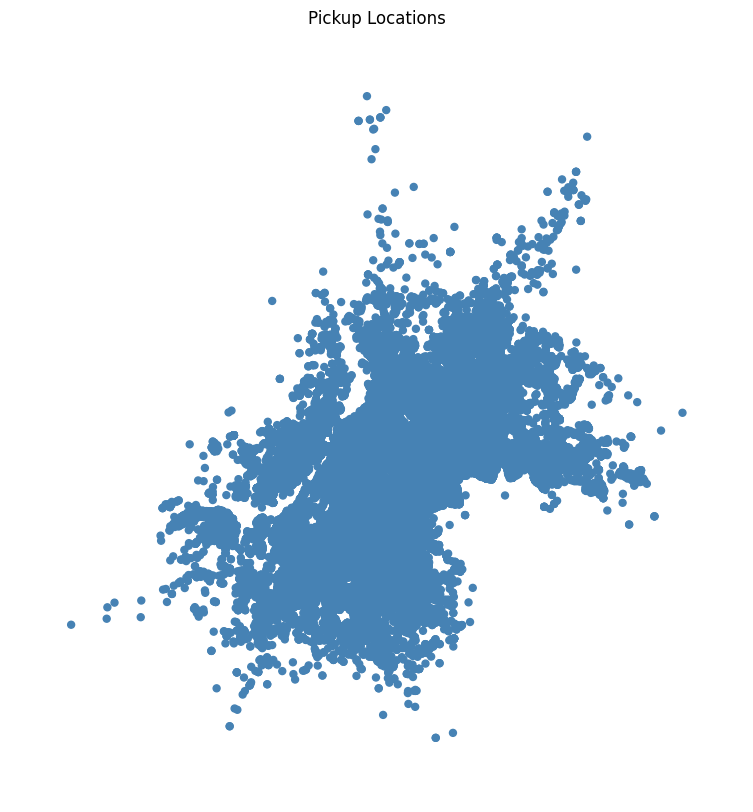

In [54]:
gnot_data_coordinates = gpd.GeoDataFrame(not_completed, geometry=gpd.points_from_xy(not_completed.longitude, not_completed.latitude))

gplt.pointplot(gnot_data_coordinates, figsize=(10, 10))
plt.title('Pickup Locations')
plt.show()

In [55]:
gnot_data_coordinates

,user_id,driver_id,request_made_at,pickup_lat_long,status,user_name,user_fare,latitude,longitude,geometry
91932,15390236,-,2024-04-15 00:00:00,"22.5868,88.4432",Missed,-,0,22.586800,88.44320,POINT (88.44320 22.58680)
164783,13526154,14702706,2024-04-15 00:01:00,"22.545365,88.36172",Cancelled By User,Sarfaraz Ahmed,0,22.545365,88.36172,POINT (88.36172 22.54537)
110370,14603014,-,2024-04-15 00:01:00,"22.57,88.4313",Missed,-,0,22.570000,88.43130,POINT (88.43130 22.57000)
90777,14988445,-,2024-04-15 00:01:00,"22.5917,88.3587",Missed,-,0,22.591700,88.35870,POINT (88.35870 22.59170)
138526,15540581,-,2024-04-15 00:01:00,"22.6426,88.4386",Missed,-,0,22.642600,88.43860,POINT (88.43860 22.64260)
...,...,...,...,...,...,...,...,...,...,...
76113,15531056,-,2024-04-30 23:58:00,"22.5716,88.4334",Missed,-,0,22.571600,88.43340,POINT (88.43340 22.57160)
43237,13444174,-,2024-04-30 23:58:00,"22.6431,88.4386",Missed,-,0,22.643100,88.43860,POINT (88.43860 22.64310)
122921,13314782,-,2024-04-30 23:59:00,"22.6432,88.4392",Missed,-,0,22.643200,88.43920,POINT (88.43920 22.64320)
53959,13533190,-,2024-04-30 23:59:00,"22.6431,88.4384",Missed,-,0,22.643100,88.43840,POINT (88.43840 22.64310)


In [56]:
import geopandas as gpd
import geoplot as gplt
import geoplot.crs as gcrs
import matplotlib.pyplot as plt
from shapely.geometry import Point

gdf = gpd.GeoDataFrame(gnot_data_coordinates, geometry=gpd.points_from_xy(gnot_data_coordinates.longitude, gnot_data_coordinates.latitude))

# Plot KDE
ax = gplt.kdeplot(
    gdf, cmap='viridis', projection=gcrs.WebMercator(), figsize=(120, 120),
    shade=True
)

gplt.pointplot(gdf, s=1, color='black', ax=ax)

gplt.webmap(gdf, ax=ax)

plt.title('Locations Heatmap', fontsize=18)
plt.show()

KeyboardInterrupt: 

In [57]:
not_completed.info()

<class 'pandas.core.frame.DataFrame'>
Index: 170642 entries, 91932 to 82162
Data columns (total 9 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   user_id          170642 non-null  int64         
 1   driver_id        170642 non-null  object        
 2   request_made_at  170642 non-null  datetime64[ns]
 3   pickup_lat_long  170642 non-null  object        
 4   status           170642 non-null  object        
 5   user_name        170642 non-null  object        
 6   user_fare        170642 non-null  int64         
 7   latitude         170642 non-null  float64       
 8   longitude        170642 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(2), object(4)
memory usage: 13.0+ MB


In [58]:
def find_users_within_interval(df, interval='15T'):
    user_counts = df.groupby('user_id')['request_made_at'].apply(lambda x: (x.diff() <= pd.Timedelta(interval)).sum())
    # Filter users who have more than one entry within the interval
    users_with_multiple_entries = user_counts[user_counts > 0]
    return users_with_multiple_entries

users_with_multiple_entries = find_users_within_interval(not_completed)

num_users = users_with_multiple_entries.shape[0]
print("Number of users with more than one entry within a 15-minute interval:", num_users)

print("User IDs with more than one entry within a 15-minute interval and their counts:")
print(users_with_multiple_entries)

total_counts = users_with_multiple_entries.sum()
print("Total number of entries within a 15-minute interval:", total_counts)

Number of users with more than one entry within a 15-minute interval: 21946
User IDs with more than one entry within a 15-minute interval and their counts:
user_id
13117245     1
13119895     3
13119902     2
13119921     1
13119997    21
            ..
15609451     1
15609518     1
15609676     1
15609791     1
15609804     1
Name: request_made_at, Length: 21946, dtype: int64
Total number of entries within a 15-minute interval: 77014


long lat doesnt change by abs dist - 500 mtr. and within time frame of 15min - remove entries. Model ARIIMA/LSTM

19k unique ids. (Not Completed) se 60k req


4 hours sliding window.
hotspots location and time.

near hooghly river Maidan - 22.55492° N, 88.34622° E
ZOOLOGICAL GARDEN 22.536956, 88.331473 below Hotspot 1
DakshinDari 22.59574° N, 88.39937° E
sector 5 22.57622° N, 88.43505° E
phoolbagan metro 22.572191, 88.390406

In [59]:
combined_data.head()

,user_id,driver_id,request_made_at,pickup_lat_long,status,user_name,user_fare,latitude,longitude
91932,15390236,-,2024-04-15 00:00:00,"22.5868,88.4432",Missed,-,0,22.586800,88.44320
164783,13526154,14702706,2024-04-15 00:01:00,"22.545365,88.36172",Cancelled By User,Sarfaraz Ahmed,0,22.545365,88.36172
110370,14603014,-,2024-04-15 00:01:00,"22.57,88.4313",Missed,-,0,22.570000,88.43130
90777,14988445,-,2024-04-15 00:01:00,"22.5917,88.3587",Missed,-,0,22.591700,88.35870
138526,15540581,-,2024-04-15 00:01:00,"22.6426,88.4386",Missed,-,0,22.642600,88.43860


In [60]:
combined_data['status'].value_counts()

status
Missed                 155047
completed               80732
Cancelled By User       13843
Cancelled By Driver      1752
Name: count, dtype: int64

In [61]:
!pip install haversine

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: /Applications/Xcode.app/Contents/Developer/usr/bin/python3 -m pip install --upgrade pip


In [62]:
from haversine import haversine, Unit

# Coordinates in decimal degrees
coord1 = (22.55492, 88.34622)  # 22.55492° N, 88.34622° E
coord2 = (22.532068, 88.327100)

# Calculate the distance
distance = haversine(coord1, coord2, unit=Unit.KILOMETERS)

print(f"The aerial distance between the two coordinates is {distance:.2f} kilometers.")


The aerial distance between the two coordinates is 3.21 kilometers.


In [63]:
maidan_coords = (22.55492, 88.34622)

def calculate_distance(lat, lon):
    point_coords = (lat, lon)
    return haversine(maidan_coords, point_coords, unit=Unit.KILOMETERS)

# Apply the function to create the new column
combined_data['aerial_dist_maidan'] = combined_data.apply(
    lambda row: calculate_distance(row['latitude'], row['longitude']), axis=1
)



In [64]:
combined_data.head()

,user_id,driver_id,request_made_at,pickup_lat_long,status,user_name,user_fare,latitude,longitude,aerial_dist_maidan
91932,15390236,-,2024-04-15 00:00:00,"22.5868,88.4432",Missed,-,0,22.586800,88.44320,10.569893
164783,13526154,14702706,2024-04-15 00:01:00,"22.545365,88.36172",Cancelled By User,Sarfaraz Ahmed,0,22.545365,88.36172,1.913769
110370,14603014,-,2024-04-15 00:01:00,"22.57,88.4313",Missed,-,0,22.570000,88.43130,8.895855
90777,14988445,-,2024-04-15 00:01:00,"22.5917,88.3587",Missed,-,0,22.591700,88.35870,4.285800
138526,15540581,-,2024-04-15 00:01:00,"22.6426,88.4386",Missed,-,0,22.642600,88.43860,13.601136


near hooghly river Maidan - 22.55492° N, 88.34622° E
ZOOLOGICAL GARDEN 22.536956, 88.331473 below Hotspot 1
DakshinDari 22.59574° N, 88.39937° E
sector 5 22.57622° N, 88.43505° E
phoolbagan metro 22.572191, 88.390406

In [65]:
zoological_garden = (22.536956, 88.321473)
dakshindari= (22.59574, 88.39937)
sector_5=(22.57622, 88.43505)
phoolbagan_metro=(22.572191, 88.390406)
wat_ganj=(22.542083, 88.326495)

def calculate_distance(coords,lat, lon):
    point_coords = (lat, lon)
    return haversine(coords, point_coords, unit=Unit.KILOMETERS)

# Apply the function to create the new column
combined_data['aerial_dist_zoological_garden'] = combined_data.apply(
    lambda row: calculate_distance(zoological_garden,row['latitude'], row['longitude']), axis=1
)

combined_data['aerial_dist_zoological_garden'] = combined_data.apply(
    lambda row: calculate_distance(zoological_garden,row['latitude'], row['longitude']), axis=1
)
combined_data['aerial_dist_dakshindari'] = combined_data.apply(
    lambda row: calculate_distance(dakshindari,row['latitude'], row['longitude']), axis=1
)
combined_data['aerial_dist_sector_V'] = combined_data.apply(
    lambda row: calculate_distance(sector_5,row['latitude'], row['longitude']), axis=1
)
combined_data['aerial_dist_phoolbagan_metro'] = combined_data.apply(
    lambda row: calculate_distance(phoolbagan_metro,row['latitude'], row['longitude']), axis=1
)
combined_data['aerial_dist_watganj'] = combined_data.apply(
    lambda row: calculate_distance(wat_ganj,row['latitude'], row['longitude']), axis=1
)

In [66]:
combined_data.head()

,user_id,driver_id,request_made_at,pickup_lat_long,status,user_name,user_fare,latitude,longitude,aerial_dist_maidan,aerial_dist_zoological_garden,aerial_dist_dakshindari,aerial_dist_sector_V,aerial_dist_phoolbagan_metro,aerial_dist_watganj
91932,15390236,-,2024-04-15 00:00:00,"22.5868,88.4432",Missed,-,0,22.586800,88.44320,10.569893,13.673193,4.608216,1.443673,5.658632,12.974236
164783,13526154,14702706,2024-04-15 00:01:00,"22.545365,88.36172",Cancelled By User,Sarfaraz Ahmed,0,22.545365,88.36172,1.913769,4.237819,6.805953,8.274734,4.192238,3.635911
110370,14603014,-,2024-04-15 00:01:00,"22.57,88.4313",Missed,-,0,22.570000,88.43130,8.895855,11.861692,4.351867,0.791587,4.205975,11.201081
90777,14988445,-,2024-04-15 00:01:00,"22.5917,88.3587",Missed,-,0,22.591700,88.35870,4.285800,7.187969,4.199325,8.025496,3.911847,6.432289
138526,15540581,-,2024-04-15 00:01:00,"22.6426,88.4386",Missed,-,0,22.642600,88.43860,13.601136,16.810364,6.585156,7.390119,9.261194,16.043094


In [67]:
combined_data.describe()

,user_id,request_made_at,user_fare,latitude,longitude,aerial_dist_maidan,aerial_dist_zoological_garden,aerial_dist_dakshindari,aerial_dist_sector_V,aerial_dist_phoolbagan_metro,aerial_dist_watganj
count,2.513740e+05,251374,251374.000000,251374.000000,251374.000000,251374.000000,251374.000000,251374.000000,251374.000000,251374.000000,251374.000000
mean,1.437881e+07,2024-04-28 22:23:40.002195712,90.072955,22.579651,88.391883,6.952669,9.350366,5.479929,6.540529,5.378133,8.740872
min,1.311724e+07,2024-04-15 00:00:00,0.000000,22.382378,88.205955,0.046747,0.004812,0.005410,0.034138,0.006246,0.008952
25%,1.356246e+07,2024-04-20 19:20:00,0.000000,22.561200,88.353800,3.326420,5.403964,3.361678,4.007648,3.748885,4.756495
50%,1.432342e+07,2024-04-26 20:28:00,0.000000,22.580264,88.396656,6.524714,9.201511,5.347837,6.560349,4.971048,8.518265
75%,1.513820e+07,2024-05-05 14:33:41.249999872,150.000000,22.600917,88.430400,9.869438,13.033345,7.045159,8.893994,6.994841,12.294594
max,1.572613e+07,2024-05-20 23:59:43,100560.000000,22.776300,88.558100,27.728031,30.803231,23.836956,25.447634,23.812455,30.040842
std,8.162092e+05,NaN,358.472091,0.034343,0.043546,3.972161,4.685795,2.886653,3.404188,2.521985,4.549940


In [68]:
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 251374 entries, 91932 to 209859
Data columns (total 15 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   user_id                        251374 non-null  int64         
 1   driver_id                      251374 non-null  object        
 2   request_made_at                251374 non-null  datetime64[ns]
 3   pickup_lat_long                251374 non-null  object        
 4   status                         251374 non-null  object        
 5   user_name                      251374 non-null  object        
 6   user_fare                      251374 non-null  int64         
 7   latitude                       251374 non-null  float64       
 8   longitude                      251374 non-null  float64       
 9   aerial_dist_maidan             251374 non-null  float64       
 10  aerial_dist_zoological_garden  251374 non-null  float64       
 11  a

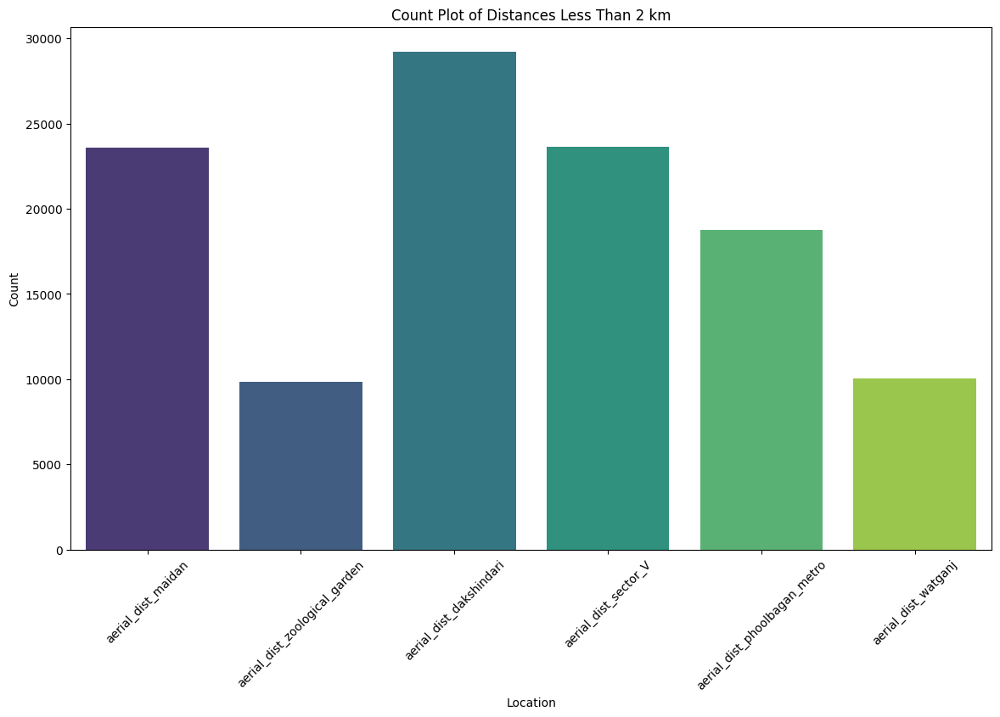

In [69]:
filtered_data = combined_data[
    (combined_data['aerial_dist_maidan'] < 2) |
    (combined_data['aerial_dist_zoological_garden'] < 2) |
    (combined_data['aerial_dist_dakshindari'] < 2) |
    (combined_data['aerial_dist_sector_V'] < 2) |
    (combined_data['aerial_dist_phoolbagan_metro'] < 2) |
    (combined_data['aerial_dist_watganj'] < 2)

]

# Melt the DataFrame to long format
melted_data = filtered_data.melt(
    value_vars=[
        'aerial_dist_maidan',
        'aerial_dist_zoological_garden',
        'aerial_dist_dakshindari',
        'aerial_dist_sector_V',
        'aerial_dist_phoolbagan_metro'
        ,'aerial_dist_watganj'
    ],
    var_name='location',
    value_name='distance'
)

# Filter the melted data where distance is less than 2
melted_data = melted_data[melted_data['distance'] < 2]

# Plot count plots
plt.figure(figsize=(14, 8))
sns.countplot(data=melted_data, x='location', palette='viridis')
plt.title('Count Plot of Distances Less Than 2 km')
plt.xlabel('Location')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


In [70]:
filtered_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 101211 entries, 91932 to 209859
Data columns (total 15 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   user_id                        101211 non-null  int64         
 1   driver_id                      101211 non-null  object        
 2   request_made_at                101211 non-null  datetime64[ns]
 3   pickup_lat_long                101211 non-null  object        
 4   status                         101211 non-null  object        
 5   user_name                      101211 non-null  object        
 6   user_fare                      101211 non-null  int64         
 7   latitude                       101211 non-null  float64       
 8   longitude                      101211 non-null  float64       
 9   aerial_dist_maidan             101211 non-null  float64       
 10  aerial_dist_zoological_garden  101211 non-null  float64       
 11  a

In [71]:
super_filtered_data=filtered_data[filtered_data['status']!='completed']

In [72]:
super_filtered_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 71221 entries, 91932 to 82162
Data columns (total 15 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   user_id                        71221 non-null  int64         
 1   driver_id                      71221 non-null  object        
 2   request_made_at                71221 non-null  datetime64[ns]
 3   pickup_lat_long                71221 non-null  object        
 4   status                         71221 non-null  object        
 5   user_name                      71221 non-null  object        
 6   user_fare                      71221 non-null  int64         
 7   latitude                       71221 non-null  float64       
 8   longitude                      71221 non-null  float64       
 9   aerial_dist_maidan             71221 non-null  float64       
 10  aerial_dist_zoological_garden  71221 non-null  float64       
 11  aerial_dist_daks

In [73]:
super_filtered_data.head()

,user_id,driver_id,request_made_at,pickup_lat_long,status,user_name,user_fare,latitude,longitude,aerial_dist_maidan,aerial_dist_zoological_garden,aerial_dist_dakshindari,aerial_dist_sector_V,aerial_dist_phoolbagan_metro,aerial_dist_watganj
91932,15390236,-,2024-04-15 00:00:00,"22.5868,88.4432",Missed,-,0,22.586800,88.44320,10.569893,13.673193,4.608216,1.443673,5.658632,12.974236
164783,13526154,14702706,2024-04-15 00:01:00,"22.545365,88.36172",Cancelled By User,Sarfaraz Ahmed,0,22.545365,88.36172,1.913769,4.237819,6.805953,8.274734,4.192238,3.635911
110370,14603014,-,2024-04-15 00:01:00,"22.57,88.4313",Missed,-,0,22.570000,88.43130,8.895855,11.861692,4.351867,0.791587,4.205975,11.201081
46646,13185172,-,2024-04-15 00:02:00,"22.545,88.3483",Missed,-,0,22.545000,88.34830,1.123547,2.896699,7.702594,9.560528,5.276022,2.262709
110371,14603014,-,2024-04-15 00:04:00,"22.57,88.4313",Missed,-,0,22.570000,88.43130,8.895855,11.861692,4.351867,0.791587,4.205975,11.201081


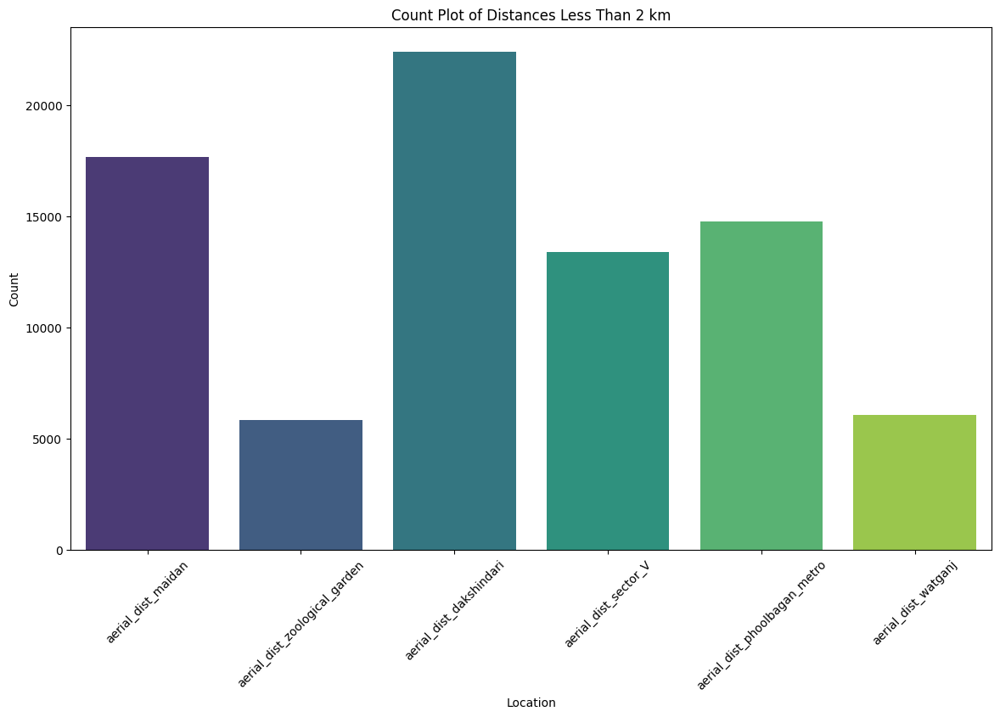

In [74]:


melted_data = super_filtered_data.melt(
    value_vars=[
        'aerial_dist_maidan',
        'aerial_dist_zoological_garden',
        'aerial_dist_dakshindari',
        'aerial_dist_sector_V',
        'aerial_dist_phoolbagan_metro'
        ,'aerial_dist_watganj'
    ],
    var_name='location',
    value_name='distance'
)

# Filter the melted data where distance is less than 2
melted_data = melted_data[melted_data['distance'] < 2]

# Plot count plots
plt.figure(figsize=(14, 8))
sns.countplot(data=melted_data, x='location', palette='viridis')
plt.title('Count Plot of Distances Less Than 2 km')
plt.xlabel('Location')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


In [75]:
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 251374 entries, 91932 to 209859
Data columns (total 15 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   user_id                        251374 non-null  int64         
 1   driver_id                      251374 non-null  object        
 2   request_made_at                251374 non-null  datetime64[ns]
 3   pickup_lat_long                251374 non-null  object        
 4   status                         251374 non-null  object        
 5   user_name                      251374 non-null  object        
 6   user_fare                      251374 non-null  int64         
 7   latitude                       251374 non-null  float64       
 8   longitude                      251374 non-null  float64       
 9   aerial_dist_maidan             251374 non-null  float64       
 10  aerial_dist_zoological_garden  251374 non-null  float64       
 11  a

In [76]:
combined_data[combined_data['status']!='completed'].value_counts().sum()

170642

In [77]:
combined_data[combined_data['status']=='completed'].value_counts().sum()

80732

In [78]:
80/220

0.36363636363636365

In [79]:
completed_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80732 entries, 0 to 80731
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   request_made_at  80732 non-null  datetime64[ns]
 1   user_id          80732 non-null  int64         
 2   driver_id        80732 non-null  int64         
 3   user_name        80732 non-null  object        
 4   pickup_lat_long  80732 non-null  object        
 5   user_fare        80732 non-null  int64         
 6   status           80732 non-null  object        
dtypes: datetime64[ns](1), int64(3), object(3)
memory usage: 4.3+ MB


In [80]:
incompleted_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 257741 entries, 0 to 257740
Data columns (total 8 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   user_id          257741 non-null  int64 
 1   driver_id        257741 non-null  object
 2   request_made_at  257741 non-null  object
 3   pickup_lat_long  257741 non-null  object
 4   status           257741 non-null  object
 5   user_name        170642 non-null  object
 6   user_fare        257741 non-null  int64 
 7   name             87099 non-null   object
dtypes: int64(2), object(6)
memory usage: 15.7+ MB


In [81]:
combined_data[(combined_data['aerial_dist_dakshindari'] < 2) & (combined_data['status'] == 'completed')].value_counts().sum()

6829

In [82]:
combined_data[(combined_data['aerial_dist_dakshindari'] < 2) & (combined_data['status'] != 'completed')].value_counts().sum()

22387

avg - 1 out 3 rides completed. 
dakshindari- 1 out of 4

In [83]:
combined_data[(combined_data['aerial_dist_maidan'] < 2) & (combined_data['status'] == 'completed')].value_counts().sum()/(combined_data[(combined_data['aerial_dist_maidan'] < 2) & (combined_data['status'] != 'completed')].value_counts().sum()+combined_data[(combined_data['aerial_dist_maidan'] < 2) & (combined_data['status'] == 'completed')].value_counts().sum())

0.25034994697773066

In [84]:
combined_data[(combined_data['aerial_dist_phoolbagan_metro'] < 2) & (combined_data['status'] == 'completed')].value_counts().sum()/(combined_data[(combined_data['aerial_dist_phoolbagan_metro'] < 2) & (combined_data['status'] != 'completed')].value_counts().sum()+combined_data[(combined_data['aerial_dist_phoolbagan_metro'] < 2) & (combined_data['status'] == 'completed')].value_counts().sum())

0.21434657578016827

In [85]:
combined_data[(combined_data['aerial_dist_sector_V'] < 2) & (combined_data['status'] == 'completed')].value_counts().sum()/(combined_data[(combined_data['aerial_dist_maidan'] < 2) & (combined_data['status'] != 'completed')].value_counts().sum()+combined_data[(combined_data['aerial_dist_maidan'] < 2) & (combined_data['status'] == 'completed')].value_counts().sum())

0.4335100742311771

In [86]:
combined_data[(combined_data['aerial_dist_watganj'] < 2) & (combined_data['status'] == 'completed')].value_counts().sum()/(combined_data[(combined_data['aerial_dist_maidan'] < 2) & (combined_data['status'] != 'completed')].value_counts().sum()+combined_data[(combined_data['aerial_dist_maidan'] < 2) & (combined_data['status'] == 'completed')].value_counts().sum())

0.1694167550371156

In [87]:
combined_data[(combined_data['aerial_dist_zoological_garden'] < 2) & (combined_data['status'] == 'completed')].value_counts().sum()/(combined_data[(combined_data['aerial_dist_maidan'] < 2) & (combined_data['status'] != 'completed')].value_counts().sum()+combined_data[(combined_data['aerial_dist_maidan'] < 2) & (combined_data['status'] == 'completed')].value_counts().sum())

0.16903499469777306

In [88]:
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 251374 entries, 91932 to 209859
Data columns (total 15 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   user_id                        251374 non-null  int64         
 1   driver_id                      251374 non-null  object        
 2   request_made_at                251374 non-null  datetime64[ns]
 3   pickup_lat_long                251374 non-null  object        
 4   status                         251374 non-null  object        
 5   user_name                      251374 non-null  object        
 6   user_fare                      251374 non-null  int64         
 7   latitude                       251374 non-null  float64       
 8   longitude                      251374 non-null  float64       
 9   aerial_dist_maidan             251374 non-null  float64       
 10  aerial_dist_zoological_garden  251374 non-null  float64       
 11  a

In [89]:
combined_data['request_made_at'].head()

91932    2024-04-15 00:00:00
164783   2024-04-15 00:01:00
110370   2024-04-15 00:01:00
90777    2024-04-15 00:01:00
138526   2024-04-15 00:01:00
Name: request_made_at, dtype: datetime64[ns]

In [90]:
combined_data['hour_of_day'] = combined_data['request_made_at'].dt.hour


In [91]:
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 251374 entries, 91932 to 209859
Data columns (total 16 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   user_id                        251374 non-null  int64         
 1   driver_id                      251374 non-null  object        
 2   request_made_at                251374 non-null  datetime64[ns]
 3   pickup_lat_long                251374 non-null  object        
 4   status                         251374 non-null  object        
 5   user_name                      251374 non-null  object        
 6   user_fare                      251374 non-null  int64         
 7   latitude                       251374 non-null  float64       
 8   longitude                      251374 non-null  float64       
 9   aerial_dist_maidan             251374 non-null  float64       
 10  aerial_dist_zoological_garden  251374 non-null  float64       
 11  a

<Figure size 1200x600 with 0 Axes>

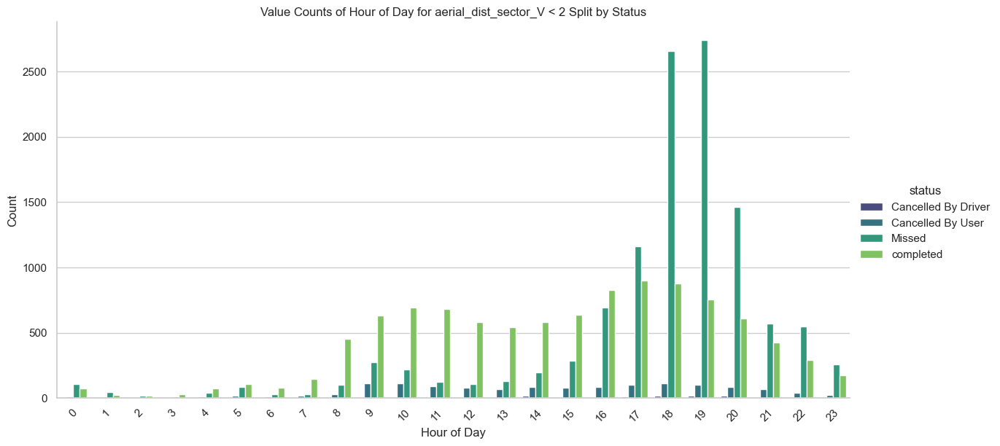

In [92]:
filtered_data = combined_data[combined_data['aerial_dist_sector_V'] < 2]

# Group by hour_of_day and status, then count the occurrences
hour_status_counts = filtered_data.groupby(['hour_of_day', 'status']).size().reset_index(name='count')

# Plot the data
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")

# Use seaborn's catplot for better handling of multiple categories
g = sns.catplot(
    data=hour_status_counts, kind="bar",
    x="hour_of_day", y="count", hue="status",
    height=6, aspect=2, palette="viridis"
)

# Customize the plot
plt.title('Value Counts of Hour of Day for aerial_dist_sector_V < 2 Split by Status')
plt.xlabel('Hour of Day')
plt.ylabel('Count')
plt.xticks(rotation=45)

# Show plot
plt.show()

<Figure size 1200x600 with 0 Axes>

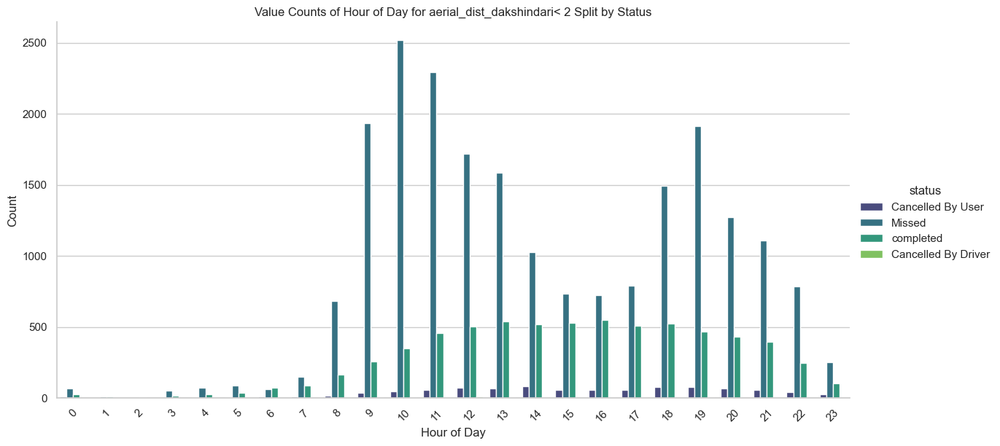

In [93]:
filtered_data = combined_data[combined_data['aerial_dist_dakshindari'] < 2]

# Group by hour_of_day and status, then count the occurrences
hour_status_counts = filtered_data.groupby(['hour_of_day', 'status']).size().reset_index(name='count')

# Plot the data
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")

# Use seaborn's catplot for better handling of multiple categories
g = sns.catplot(
    data=hour_status_counts, kind="bar",
    x="hour_of_day", y="count", hue="status",
    height=6, aspect=2, palette="viridis"
)

# Customize the plot
plt.title('Value Counts of Hour of Day for aerial_dist_dakshindari< 2 Split by Status')
plt.xlabel('Hour of Day')
plt.ylabel('Count')
plt.xticks(rotation=45)

# Show plot
plt.show()

 10  aerial_dist_zoological_garden  226463 non-null  float64       
 13  aerial_dist_phoolbagan_metro   226463 non-null  float64       
 14  aerial_dist_watganj            226463 non-null  float64    

<Figure size 1200x600 with 0 Axes>

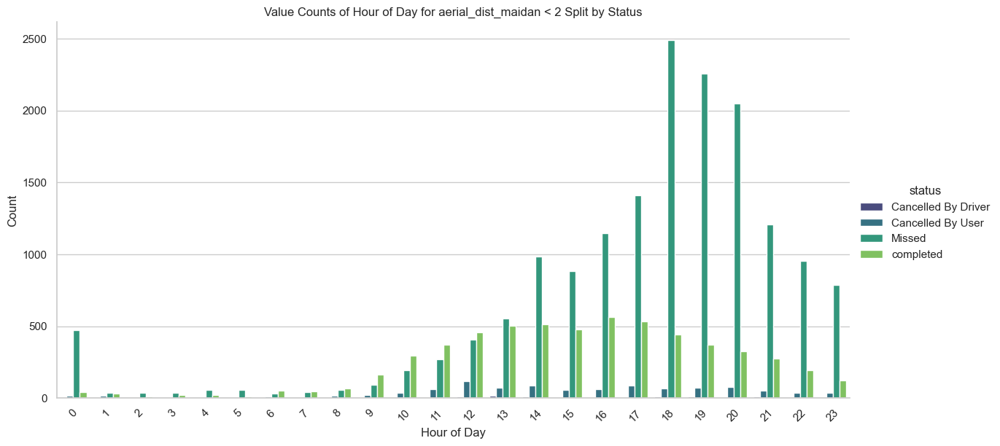

In [94]:
filtered_data = combined_data[combined_data['aerial_dist_maidan'] < 2]

# Group by hour_of_day and status, then count the occurrences
hour_status_counts = filtered_data.groupby(['hour_of_day', 'status']).size().reset_index(name='count')

# Plot the data
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")

# Use seaborn's catplot for better handling of multiple categories
g = sns.catplot(
    data=hour_status_counts, kind="bar",
    x="hour_of_day", y="count", hue="status",
    height=6, aspect=2, palette="viridis"
)

# Customize the plot
plt.title('Value Counts of Hour of Day for aerial_dist_maidan < 2 Split by Status')
plt.xlabel('Hour of Day')
plt.ylabel('Count')
plt.xticks(rotation=45)

# Show plot
plt.show()

<Figure size 1200x600 with 0 Axes>

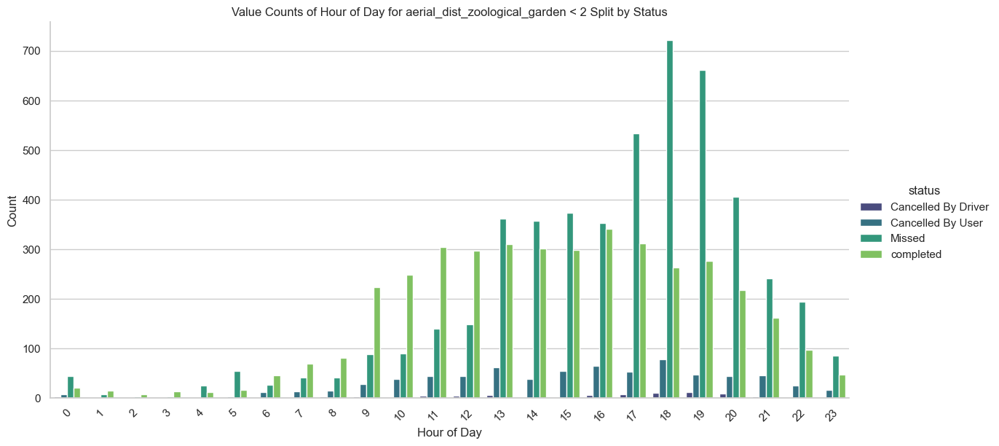

In [95]:
filtered_data = combined_data[combined_data['aerial_dist_zoological_garden'] < 2]

# Group by hour_of_day and status, then count the occurrences
hour_status_counts = filtered_data.groupby(['hour_of_day', 'status']).size().reset_index(name='count')

# Plot the data
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")

# Use seaborn's catplot for better handling of multiple categories
g = sns.catplot(
    data=hour_status_counts, kind="bar",
    x="hour_of_day", y="count", hue="status",
    height=6, aspect=2, palette="viridis"
)

# Customize the plot
plt.title('Value Counts of Hour of Day for aerial_dist_zoological_garden < 2 Split by Status')
plt.xlabel('Hour of Day')
plt.ylabel('Count')
plt.xticks(rotation=45)

# Show plot
plt.show()

 10  aerial_dist_zoological_garden  226463 non-null  float64       
 13  aerial_dist_phoolbagan_metro   226463 non-null  float64       
 14  aerial_dist_watganj            226463 non-null  float64    

<Figure size 1200x600 with 0 Axes>

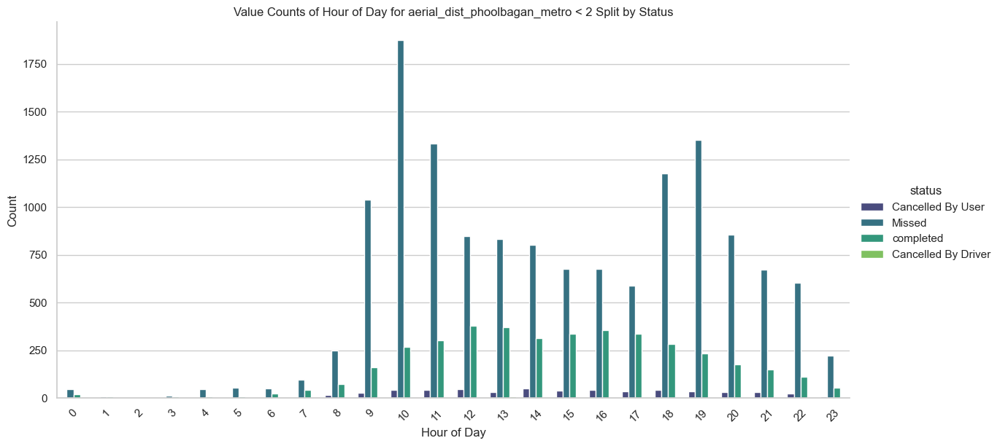

In [96]:
filtered_data = combined_data[combined_data['aerial_dist_phoolbagan_metro'] < 2]

# Group by hour_of_day and status, then count the occurrences
hour_status_counts = filtered_data.groupby(['hour_of_day', 'status']).size().reset_index(name='count')

# Plot the data
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")

# Use seaborn's catplot for better handling of multiple categories
g = sns.catplot(
    data=hour_status_counts, kind="bar",
    x="hour_of_day", y="count", hue="status",
    height=6, aspect=2, palette="viridis"
)

# Customize the plot
plt.title('Value Counts of Hour of Day for aerial_dist_phoolbagan_metro < 2 Split by Status')
plt.xlabel('Hour of Day')
plt.ylabel('Count')
plt.xticks(rotation=45)

# Show plot
plt.show()

<Figure size 1200x600 with 0 Axes>

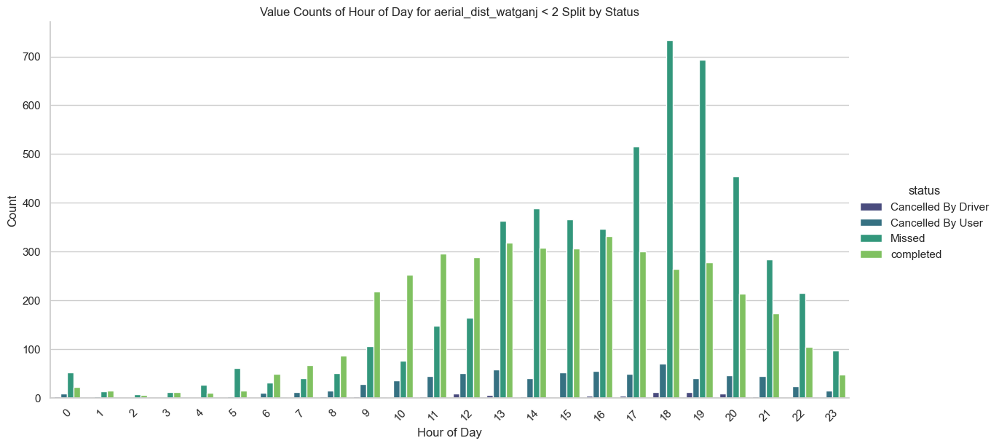

In [97]:
filtered_data = combined_data[combined_data['aerial_dist_watganj'] < 2]

# Group by hour_of_day and status, then count the occurrences
hour_status_counts = filtered_data.groupby(['hour_of_day', 'status']).size().reset_index(name='count')

# Plot the data
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")

# Use seaborn's catplot for better handling of multiple categories
g = sns.catplot(
    data=hour_status_counts, kind="bar",
    x="hour_of_day", y="count", hue="status",
    height=6, aspect=2, palette="viridis"
)

# Customize the plot
plt.title('Value Counts of Hour of Day for aerial_dist_watganj < 2 Split by Status')
plt.xlabel('Hour of Day')
plt.ylabel('Count')
plt.xticks(rotation=45)

# Show plot
plt.show()

In [98]:
filtered_data[(filtered_data['status']=='completed') & (filtered_data['hour_of_day'].isin([18, 19, 20, 21]))].value_counts().sum()

930

In [99]:
filtered_data[(filtered_data['status']!='completed') & (filtered_data['hour_of_day'].isin([18, 19, 20, 21]))].value_counts().sum()

2407

In [100]:
filtered_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10059 entries, 52530 to 209883
Data columns (total 16 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   user_id                        10059 non-null  int64         
 1   driver_id                      10059 non-null  object        
 2   request_made_at                10059 non-null  datetime64[ns]
 3   pickup_lat_long                10059 non-null  object        
 4   status                         10059 non-null  object        
 5   user_name                      10059 non-null  object        
 6   user_fare                      10059 non-null  int64         
 7   latitude                       10059 non-null  float64       
 8   longitude                      10059 non-null  float64       
 9   aerial_dist_maidan             10059 non-null  float64       
 10  aerial_dist_zoological_garden  10059 non-null  float64       
 11  aerial_dist_dak

In [101]:
filtered_data.head()

,user_id,driver_id,request_made_at,pickup_lat_long,status,user_name,user_fare,latitude,longitude,aerial_dist_maidan,aerial_dist_zoological_garden,aerial_dist_dakshindari,aerial_dist_sector_V,aerial_dist_phoolbagan_metro,aerial_dist_watganj,hour_of_day
52530,15258113,-,2024-04-15 00:14:00,"22.5377,88.3442",Missed,-,0,22.53770,88.34420,1.925984,2.335599,8.587340,10.265525,6.101066,1.882507,0
157428,15274439,15271868,2024-04-15 00:14:00,"22.5442,88.3236",Cancelled By Driver,Ashutosh Kumar Das,0,22.54420,88.32360,2.610926,0.834592,9.662934,11.985424,7.533195,0.379220,0
165741,14749815,13708700,2024-04-15 00:46:00,"22.53718,88.32536",Cancelled By User,Vijay Singh,0,22.53718,88.32536,2.912112,0.399984,10.007617,12.071484,7.731282,0.557512,0
141454,15433528,-,2024-04-15 04:52:00,"22.5385,88.3212",Missed,-,0,22.53850,88.32120,3.152101,0.173960,10.243855,12.420655,8.033702,0.674131,4
2976,14000257,-,2024-04-15 05:02:00,"22.5351,88.3245",Missed,-,0,22.53510,88.32450,3.135703,0.373151,10.225889,12.238525,7.925611,0.803053,5


In [102]:
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 251374 entries, 91932 to 209859
Data columns (total 16 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   user_id                        251374 non-null  int64         
 1   driver_id                      251374 non-null  object        
 2   request_made_at                251374 non-null  datetime64[ns]
 3   pickup_lat_long                251374 non-null  object        
 4   status                         251374 non-null  object        
 5   user_name                      251374 non-null  object        
 6   user_fare                      251374 non-null  int64         
 7   latitude                       251374 non-null  float64       
 8   longitude                      251374 non-null  float64       
 9   aerial_dist_maidan             251374 non-null  float64       
 10  aerial_dist_zoological_garden  251374 non-null  float64       
 11  a

In [103]:
!pip install dtale

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: /Applications/Xcode.app/Contents/Developer/usr/bin/python3 -m pip install --upgrade pip


In [104]:
not_completed=combined_data[combined_data['status']!='completed']

In [105]:
not_completed.info()


<class 'pandas.core.frame.DataFrame'>
Index: 170642 entries, 91932 to 82162
Data columns (total 16 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   user_id                        170642 non-null  int64         
 1   driver_id                      170642 non-null  object        
 2   request_made_at                170642 non-null  datetime64[ns]
 3   pickup_lat_long                170642 non-null  object        
 4   status                         170642 non-null  object        
 5   user_name                      170642 non-null  object        
 6   user_fare                      170642 non-null  int64         
 7   latitude                       170642 non-null  float64       
 8   longitude                      170642 non-null  float64       
 9   aerial_dist_maidan             170642 non-null  float64       
 10  aerial_dist_zoological_garden  170642 non-null  float64       
 11  ae

In [106]:
# List of columns to check
aerial_dist_columns = [
    'aerial_dist_maidan',
    'aerial_dist_zoological_garden',
    'aerial_dist_dakshindari',
    'aerial_dist_sector_V',
    'aerial_dist_phoolbagan_metro',
    'aerial_dist_watganj'
]

# Create a boolean DataFrame where each entry is True if the corresponding value is greater than 2
boolean_df = not_completed[aerial_dist_columns] > 2

# Count the number of rows where all columns are True (all values > 2)
count_all_greater_than_2 = boolean_df.all(axis=1).sum()

print(f"Number of rows where all specified columns have values greater than 2: {count_all_greater_than_2}")


Number of rows where all specified columns have values greater than 2: 99421


close to 50% from the hotspot

In [107]:
not_hotspot = combined_data[
    (combined_data['aerial_dist_dakshindari'] > 2) &
    (combined_data['aerial_dist_maidan'] > 2) &
    (combined_data['aerial_dist_phoolbagan_metro'] > 2) &
    (combined_data['aerial_dist_sector_V'] > 2) &
    (combined_data['aerial_dist_watganj'] > 2) &
    (combined_data['aerial_dist_zoological_garden'] > 2)
]


In [108]:
not_hotspot.head()

,user_id,driver_id,request_made_at,pickup_lat_long,status,user_name,user_fare,latitude,longitude,aerial_dist_maidan,aerial_dist_zoological_garden,aerial_dist_dakshindari,aerial_dist_sector_V,aerial_dist_phoolbagan_metro,aerial_dist_watganj,hour_of_day
90777,14988445,-,2024-04-15 00:01:00,"22.5917,88.3587",Missed,-,0,22.591700,88.358700,4.285800,7.187969,4.199325,8.025496,3.911847,6.432289,0
138526,15540581,-,2024-04-15 00:01:00,"22.6426,88.4386",Missed,-,0,22.642600,88.438600,13.601136,16.810364,6.585156,7.390119,9.261194,16.043094,0
156949,14932904,15358903,2024-04-15 00:01:00,"22.59702,88.43055",Cancelled By User,Suresh Yadav,0,22.597020,88.430550,9.843007,13.040313,3.204075,2.358549,4.960759,12.307326,0
165631,14990491,14904308,2024-04-15 00:03:00,"22.590135,88.452636",Cancelled By User,Gaurav Kumar,0,22.590135,88.452636,11.606922,14.709223,5.503780,2.377822,6.693492,14.011178,0
157350,13134751,15239940,2024-04-15 00:04:00,"22.547079,88.388003",Cancelled By Driver,Sk Mortoja,0,22.547079,88.388003,4.378505,6.924705,5.535310,5.817091,2.803212,6.341112,0


In [109]:
not_hotspot.describe()

,user_id,request_made_at,user_fare,latitude,longitude,aerial_dist_maidan,aerial_dist_zoological_garden,aerial_dist_dakshindari,aerial_dist_sector_V,aerial_dist_phoolbagan_metro,aerial_dist_watganj,hour_of_day
count,1.501630e+05,150163,150163.000000,150163.000000,150163.000000,150163.000000,150163.000000,150163.000000,150163.000000,150163.000000,150163.000000,150163.000000
mean,1.442951e+07,2024-04-29 07:05:48.968541440,105.843543,22.583905,88.393547,7.724584,10.080347,6.238118,7.313026,6.290950,9.480414,14.399126
min,1.311724e+07,2024-04-15 00:01:00,0.000000,22.382378,88.205955,2.000267,2.001113,2.000089,2.000001,2.000191,2.001309,0.000000
25%,1.368626e+07,2024-04-20 23:33:00,0.000000,22.564598,88.353600,3.568967,5.578788,4.353255,5.175614,4.406366,4.987248,11.000000
50%,1.438307e+07,2024-04-27 11:14:00,0.000000,22.583900,88.389300,6.887772,8.750253,5.969424,7.439644,5.960964,8.223914,14.000000
75%,1.520612e+07,2024-05-06 09:11:34.500000,183.000000,22.613900,88.434857,11.735095,14.836834,7.458297,9.432165,8.178452,14.126148,19.000000
max,1.572613e+07,2024-05-20 23:59:29,100560.000000,22.776300,88.558100,27.728031,30.803231,23.836956,25.447634,23.812455,30.040842,23.000000
std,8.183678e+05,NaN,452.841719,0.040119,0.047606,4.256872,4.919548,2.638891,3.033910,2.452719,4.789630,4.867550


In [110]:
combined_data[combined_data['aerial_dist_dakshindari']<2].value_counts().sum()

29216

In [111]:
not_hotspot.info()

<class 'pandas.core.frame.DataFrame'>
Index: 150163 entries, 90777 to 209861
Data columns (total 16 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   user_id                        150163 non-null  int64         
 1   driver_id                      150163 non-null  object        
 2   request_made_at                150163 non-null  datetime64[ns]
 3   pickup_lat_long                150163 non-null  object        
 4   status                         150163 non-null  object        
 5   user_name                      150163 non-null  object        
 6   user_fare                      150163 non-null  int64         
 7   latitude                       150163 non-null  float64       
 8   longitude                      150163 non-null  float64       
 9   aerial_dist_maidan             150163 non-null  float64       
 10  aerial_dist_zoological_garden  150163 non-null  float64       
 11  a

In [112]:
not_hotspot[not_hotspot['status']!='completed'].value_counts().sum()

99421

In [113]:
hotspot = combined_data[
    (combined_data['aerial_dist_dakshindari'] < 2) |
    (combined_data['aerial_dist_maidan'] < 2) |
    (combined_data['aerial_dist_phoolbagan_metro'] < 2) |
    (combined_data['aerial_dist_sector_V'] < 2) |
    (combined_data['aerial_dist_watganj'] < 2) |
    (combined_data['aerial_dist_zoological_garden'] < 2)
]

In [114]:
hotspot.info()

<class 'pandas.core.frame.DataFrame'>
Index: 101211 entries, 91932 to 209859
Data columns (total 16 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   user_id                        101211 non-null  int64         
 1   driver_id                      101211 non-null  object        
 2   request_made_at                101211 non-null  datetime64[ns]
 3   pickup_lat_long                101211 non-null  object        
 4   status                         101211 non-null  object        
 5   user_name                      101211 non-null  object        
 6   user_fare                      101211 non-null  int64         
 7   latitude                       101211 non-null  float64       
 8   longitude                      101211 non-null  float64       
 9   aerial_dist_maidan             101211 non-null  float64       
 10  aerial_dist_zoological_garden  101211 non-null  float64       
 11  a

In [115]:
hotspot[hotspot['status']=='completed'].value_counts().sum()

29990

In [116]:
not_hotspot[not_hotspot['status']=='completed'].value_counts().sum()

50742

In [117]:
not_hotspot.info()

<class 'pandas.core.frame.DataFrame'>
Index: 150163 entries, 90777 to 209861
Data columns (total 16 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   user_id                        150163 non-null  int64         
 1   driver_id                      150163 non-null  object        
 2   request_made_at                150163 non-null  datetime64[ns]
 3   pickup_lat_long                150163 non-null  object        
 4   status                         150163 non-null  object        
 5   user_name                      150163 non-null  object        
 6   user_fare                      150163 non-null  int64         
 7   latitude                       150163 non-null  float64       
 8   longitude                      150163 non-null  float64       
 9   aerial_dist_maidan             150163 non-null  float64       
 10  aerial_dist_zoological_garden  150163 non-null  float64       
 11  a

In [118]:
g_not_hotspot = gpd.GeoDataFrame(not_hotspot, geometry=gpd.points_from_xy(not_hotspot.longitude, not_hotspot.latitude))

g_not_hotspot['latitude'] = g_not_hotspot['latitude'].apply(lambda x: '{:.4f}'.format(x))
g_not_hotspot['longitude'] = g_not_hotspot['longitude'].apply(lambda x: '{:.4f}'.format(x))

In [119]:
import geopandas as gpd
import geoplot as gplt
import geoplot.crs as gcrs
import matplotlib.pyplot as plt
from shapely.geometry import Point

gdf = gpd.GeoDataFrame(g_not_hotspot, geometry=gpd.points_from_xy(g_not_hotspot.longitude, g_not_hotspot.latitude))

# Plot KDE
ax = gplt.kdeplot(
    gdf, cmap='viridis', projection=gcrs.WebMercator(), figsize=(120, 120),
    shade=True
)

gplt.pointplot(gdf, s=1, color='black', ax=ax)

gplt.webmap(gdf, ax=ax)

plt.title('Locations Heatmap', fontsize=18)
plt.show()


/Users/aayushjain/Library/Python/3.9/lib/python/site-packages/geoplot/geoplot.py:1304: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(


KeyboardInterrupt: 

22.583474, 88.342969 howrah 
22.642434, 88.439351 airport 

In [120]:
howrah=(22.583474, 88.342969)
ccu=(22.642434, 88.439351)

In [121]:
not_hotspot['aerial_dist_howrah_st'] = not_hotspot.apply(
    lambda row: calculate_distance(howrah,row['latitude'], row['longitude']), axis=1
)
not_hotspot['aerial_dist_ccu'] = not_hotspot.apply(
    lambda row: calculate_distance(ccu,row['latitude'], row['longitude']), axis=1
)

/var/folders/q_/dn720rf91691y39h0s_hr_280000gn/T/ipykernel_98087/1718496868.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  not_hotspot['aerial_dist_howrah_st'] = not_hotspot.apply(
/var/folders/q_/dn720rf91691y39h0s_hr_280000gn/T/ipykernel_98087/1718496868.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  not_hotspot['aerial_dist_ccu'] = not_hotspot.apply(


In [122]:
not_hotspot[(not_hotspot['aerial_dist_ccu'] < 2) | (not_hotspot['aerial_dist_howrah_st'] < 2)].value_counts().sum()

49945

In [123]:
not_hotspot.info()

<class 'pandas.core.frame.DataFrame'>
Index: 150163 entries, 90777 to 209861
Data columns (total 18 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   user_id                        150163 non-null  int64         
 1   driver_id                      150163 non-null  object        
 2   request_made_at                150163 non-null  datetime64[ns]
 3   pickup_lat_long                150163 non-null  object        
 4   status                         150163 non-null  object        
 5   user_name                      150163 non-null  object        
 6   user_fare                      150163 non-null  int64         
 7   latitude                       150163 non-null  float64       
 8   longitude                      150163 non-null  float64       
 9   aerial_dist_maidan             150163 non-null  float64       
 10  aerial_dist_zoological_garden  150163 non-null  float64       
 11  a

In [124]:
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 251374 entries, 91932 to 209859
Data columns (total 16 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   user_id                        251374 non-null  int64         
 1   driver_id                      251374 non-null  object        
 2   request_made_at                251374 non-null  datetime64[ns]
 3   pickup_lat_long                251374 non-null  object        
 4   status                         251374 non-null  object        
 5   user_name                      251374 non-null  object        
 6   user_fare                      251374 non-null  int64         
 7   latitude                       251374 non-null  float64       
 8   longitude                      251374 non-null  float64       
 9   aerial_dist_maidan             251374 non-null  float64       
 10  aerial_dist_zoological_garden  251374 non-null  float64       
 11  a

In [125]:
!pip install prophet

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: /Applications/Xcode.app/Contents/Developer/usr/bin/python3 -m pip install --upgrade pip


In [126]:
import pandas as pd
from prophet import Prophet



/Users/aayushjain/Library/Python/3.9/lib/python/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [127]:
print(combined_data.isna().sum())


user_id                          0
driver_id                        0
request_made_at                  0
pickup_lat_long                  0
status                           0
user_name                        0
user_fare                        0
latitude                         0
longitude                        0
aerial_dist_maidan               0
aerial_dist_zoological_garden    0
aerial_dist_dakshindari          0
aerial_dist_sector_V             0
aerial_dist_phoolbagan_metro     0
aerial_dist_watganj              0
hour_of_day                      0
dtype: int64


In [128]:
from datetime import datetime, timedelta
import pandas as pd
from prophet import Prophet

data = combined_data.copy()
data['request_made_at'] = pd.to_datetime(data['request_made_at'])
data['date'] = data['request_made_at'].dt.date
data['hour'] = data['request_made_at'].dt.hour

hotspot_data = data[data['aerial_dist_sector_V'] < 2]

hourly_demand = hotspot_data.groupby(['date', 'hour']).size().reset_index(name='y')

hourly_demand['ds'] = hourly_demand.apply(lambda row: datetime.combine(row['date'], datetime.min.time()) + timedelta(hours=row['hour']), axis=1)

hourly_demand = hourly_demand.drop(columns=['date', 'hour'])

hourly_demand['ds'] = pd.to_datetime(hourly_demand['ds'])

print("Hourly Demand Data:")
print(hourly_demand.head())
print(hourly_demand.info())

Hourly Demand Data:
    y                  ds
0  12 2024-04-15 00:00:00
1   2 2024-04-15 01:00:00
2   2 2024-04-15 04:00:00
3   4 2024-04-15 05:00:00
4   1 2024-04-15 06:00:00
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 814 entries, 0 to 813
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   y       814 non-null    int64         
 1   ds      814 non-null    datetime64[ns]
dtypes: datetime64[ns](1), int64(1)
memory usage: 12.8 KB
None


In [129]:
train_start_date = datetime(2024, 5, 19)  # Adjust the date as needed based on your data

test = hourly_demand[hourly_demand['ds'] < train_start_date]
train = hourly_demand[hourly_demand['ds'] >= train_start_date]

# Print the train and test data to inspect
print("Train Data:")
print(train.head())
print(train.info())

print("Test Data:")
print(test.head())
print(test.info())

Train Data:
     y                  ds
769  4 2024-05-19 00:00:00
770  2 2024-05-19 01:00:00
771  2 2024-05-19 03:00:00
772  3 2024-05-19 04:00:00
773  3 2024-05-19 05:00:00
<class 'pandas.core.frame.DataFrame'>
Index: 45 entries, 769 to 813
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   y       45 non-null     int64         
 1   ds      45 non-null     datetime64[ns]
dtypes: datetime64[ns](1), int64(1)
memory usage: 1.1 KB
None
Test Data:
    y                  ds
0  12 2024-04-15 00:00:00
1   2 2024-04-15 01:00:00
2   2 2024-04-15 04:00:00
3   4 2024-04-15 05:00:00
4   1 2024-04-15 06:00:00
<class 'pandas.core.frame.DataFrame'>
Index: 769 entries, 0 to 768
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   y       769 non-null    int64         
 1   ds      769 non-null    datetime64[ns]
dtypes: datetime64[ns](1), int64(1)
memory usa

In [130]:


if train.shape[0] < 2:
    raise ValueError("Train DataFrame has less than 2 non-NaN rows.")


In [131]:
model = Prophet()
model.fit(train)

17:22:16 - cmdstanpy - INFO - Chain [1] start processing


17:22:16 - cmdstanpy - INFO - Chain [1] done processing


In [132]:
future = model.make_future_dataframe(periods=24, freq='H')
forecast = model.predict(future)

In [133]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2024-05-19 00:00:00,7.312460,-9.318212,25.446057,7.312460,7.312460,0.0,0.0,0.0,0.0,0.0,0.0,7.312460
1,2024-05-19 01:00:00,7.788857,-7.649255,25.385417,7.788857,7.788857,0.0,0.0,0.0,0.0,0.0,0.0,7.788857
2,2024-05-19 03:00:00,8.741652,-8.714933,25.949675,8.741652,8.741652,0.0,0.0,0.0,0.0,0.0,0.0,8.741652
3,2024-05-19 04:00:00,9.218050,-8.427989,26.091215,9.218050,9.218050,0.0,0.0,0.0,0.0,0.0,0.0,9.218050
4,2024-05-19 05:00:00,9.694447,-7.765532,27.076675,9.694447,9.694447,0.0,0.0,0.0,0.0,0.0,0.0,9.694447
...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,2024-05-21 19:00:00,39.231085,22.219924,56.750327,39.231084,39.231086,0.0,0.0,0.0,0.0,0.0,0.0,39.231085
65,2024-05-21 20:00:00,39.707482,22.274759,56.467775,39.707481,39.707483,0.0,0.0,0.0,0.0,0.0,0.0,39.707482
66,2024-05-21 21:00:00,40.183879,22.162497,55.406493,40.183879,40.183880,0.0,0.0,0.0,0.0,0.0,0.0,40.183879
67,2024-05-21 22:00:00,40.660277,23.383619,57.580419,40.660276,40.660278,0.0,0.0,0.0,0.0,0.0,0.0,40.660277


In [134]:
forecast_22=forecast.head(22)

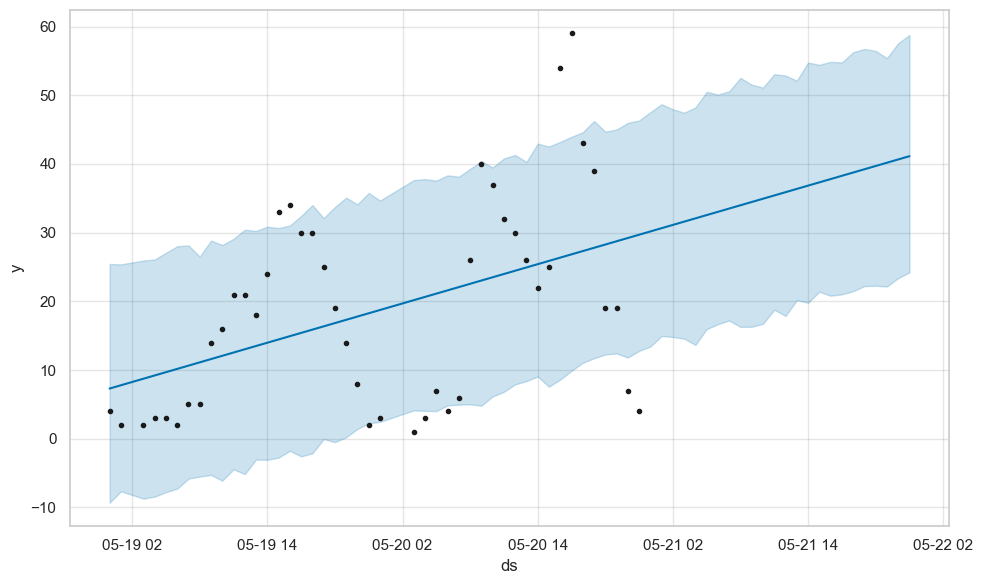

In [135]:
fig1 = model.plot(forecast)


In [136]:
from datetime import datetime, timedelta
import pandas as pd
from prophet import Prophet

data = combined_data.copy()
data['request_made_at'] = pd.to_datetime(data['request_made_at'])
data['date'] = data['request_made_at'].dt.date
data['hour'] = data['request_made_at'].dt.hour

hotspot_data = data

hourly_demand = hotspot_data.groupby(['date', 'hour']).size().reset_index(name='y')

hourly_demand['ds'] = hourly_demand.apply(lambda row: datetime.combine(row['date'], datetime.min.time()) + timedelta(hours=row['hour']), axis=1)

hourly_demand = hourly_demand.drop(columns=['date', 'hour'])

hourly_demand['ds'] = pd.to_datetime(hourly_demand['ds'])

print("Hourly Demand Data:")
print(hourly_demand.tail())
print(hourly_demand.info())

Hourly Demand Data:
       y                  ds
859  203 2024-05-20 19:00:00
860  161 2024-05-20 20:00:00
861  158 2024-05-20 21:00:00
862   72 2024-05-20 22:00:00
863   54 2024-05-20 23:00:00
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 864 entries, 0 to 863
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   y       864 non-null    int64         
 1   ds      864 non-null    datetime64[ns]
dtypes: datetime64[ns](1), int64(1)
memory usage: 13.6 KB
None


In [137]:
train_start_date = datetime(2024, 5, 19)  # Adjust the date as needed based on your data

test = hourly_demand[hourly_demand['ds'] < train_start_date]
train = hourly_demand[hourly_demand['ds'] >= train_start_date]

# Print the train and test data to inspect
print("Train Data:")
print(train.head())
print(train.info())

print("Test Data:")
print(test.head())
print(test.info())

Train Data:
      y                  ds
816  58 2024-05-19 00:00:00
817  21 2024-05-19 01:00:00
818  11 2024-05-19 02:00:00
819  16 2024-05-19 03:00:00
820  34 2024-05-19 04:00:00
<class 'pandas.core.frame.DataFrame'>
Index: 48 entries, 816 to 863
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   y       48 non-null     int64         
 1   ds      48 non-null     datetime64[ns]
dtypes: datetime64[ns](1), int64(1)
memory usage: 1.1 KB
None
Test Data:
    y                  ds
0  93 2024-04-15 00:00:00
1  31 2024-04-15 01:00:00
2  13 2024-04-15 02:00:00
3  22 2024-04-15 03:00:00
4  43 2024-04-15 04:00:00
<class 'pandas.core.frame.DataFrame'>
Index: 816 entries, 0 to 815
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   y       816 non-null    int64         
 1   ds      816 non-null    datetime64[ns]
dtypes: datetime64[ns](1), int64(1)
memo

17:22:17 - cmdstanpy - INFO - Chain [1] start processing
17:22:17 - cmdstanpy - INFO - Chain [1] done processing


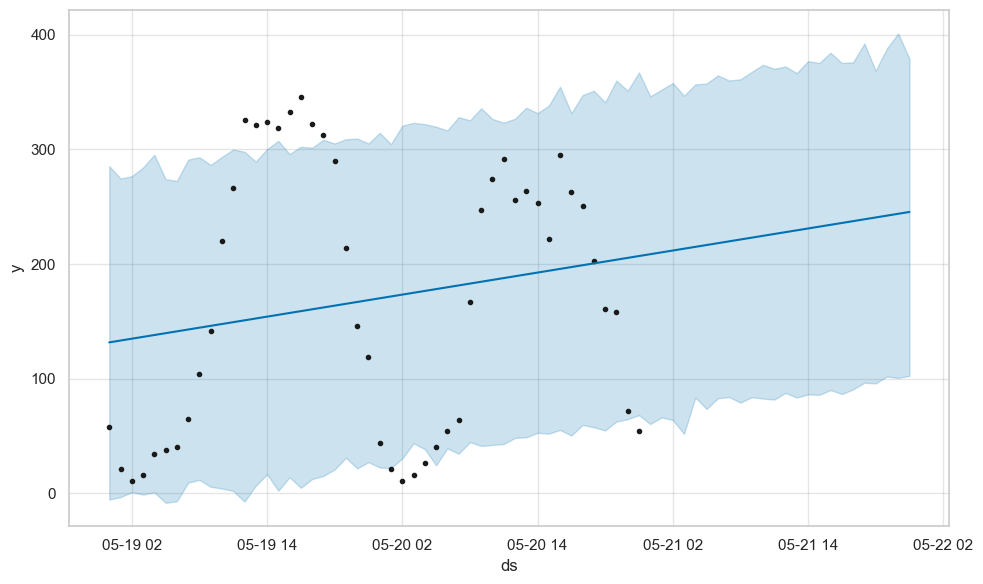

In [138]:
model = Prophet()
model.fit(train)
future = model.make_future_dataframe(periods=24, freq='H')
forecast = model.predict(future)
fig1 = model.plot(forecast)


In [139]:
forecast.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72 entries, 0 to 71
Data columns (total 13 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   ds                          72 non-null     datetime64[ns]
 1   trend                       72 non-null     float64       
 2   yhat_lower                  72 non-null     float64       
 3   yhat_upper                  72 non-null     float64       
 4   trend_lower                 72 non-null     float64       
 5   trend_upper                 72 non-null     float64       
 6   additive_terms              72 non-null     float64       
 7   additive_terms_lower        72 non-null     float64       
 8   additive_terms_upper        72 non-null     float64       
 9   multiplicative_terms        72 non-null     float64       
 10  multiplicative_terms_lower  72 non-null     float64       
 11  multiplicative_terms_upper  72 non-null     float64       
 

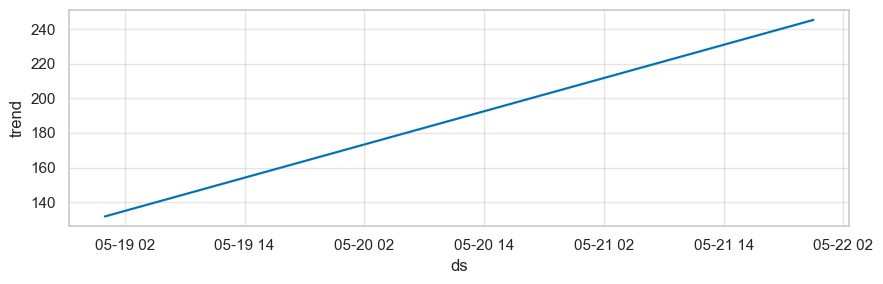

In [140]:
fig = model.plot_components(forecast)


In [141]:
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 251374 entries, 91932 to 209859
Data columns (total 16 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   user_id                        251374 non-null  int64         
 1   driver_id                      251374 non-null  object        
 2   request_made_at                251374 non-null  datetime64[ns]
 3   pickup_lat_long                251374 non-null  object        
 4   status                         251374 non-null  object        
 5   user_name                      251374 non-null  object        
 6   user_fare                      251374 non-null  int64         
 7   latitude                       251374 non-null  float64       
 8   longitude                      251374 non-null  float64       
 9   aerial_dist_maidan             251374 non-null  float64       
 10  aerial_dist_zoological_garden  251374 non-null  float64       
 11  a

In [142]:
data_lstm=combined_data.copy()

In [143]:
df=combined_data.copy()

In [144]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

In [145]:
# Create input sequences and target variables
X = []
y = []
sequence_length = 24  # Length of input sequences (e.g., 24 hours)

for i in range(len(df) - sequence_length - 1):
    X.append(df['hour_of_day'].values[i:i+sequence_length])
    y.append(df['hour_of_day'].values[i+sequence_length])

X = np.array(X)
y = np.array(y)

In [146]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_val = np.reshape(X_val, (X_val.shape[0], X_val.shape[1], 1))

In [ ]:
model = Sequential()
model.add(LSTM(64, input_shape=(sequence_length, 1)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
model.fit(X_train, y_train, epochs=5, batch_size=32, validation_data=(X_val, y_val))

Epoch 1/5
5661/5661 [==============================] - 57s 10ms/step - loss: 2.3524 - val_loss: 0.0384
Epoch 2/5
5661/5661 [==============================] - 59s 10ms/step - loss: 0.0550 - val_loss: 0.0370
Epoch 3/5
5661/5661 [==============================] - 61s 11ms/step - loss: 0.0542 - val_loss: 0.0372
Epoch 4/5
5661/5661 [==============================] - 53s 9ms/step - loss: 0.0533 - val_loss: 0.0370
Epoch 5/5
5661/5661 [==============================] - 86s 15ms/step - loss: 0.0530 - val_loss: 0.0385


In [ ]:
X_train

array([[[11],
        [11],
        [11],
        ...,
        [11],
        [11],
        [11]],

       [[20],
        [20],
        [20],
        ...,
        [20],
        [20],
        [20]],

       [[12],
        [12],
        [12],
        ...,
        [12],
        [12],
        [12]],

       ...,

       [[19],
        [19],
        [19],
        ...,
        [19],
        [19],
        [19]],

       [[10],
        [10],
        [10],
        ...,
        [10],
        [10],
        [10]],

       [[21],
        [21],
        [21],
        ...,
        [21],
        [21],
        [21]]], dtype=int32)

In [ ]:
X_train.shape

(181150, 24, 1)

In [ ]:
loss = model.evaluate(X_val, y_val)
print(f'Validation loss: {loss}')


1416/1416 [==============================] - 8s 5ms/step - loss: 0.0385
Validation loss: 0.03850000351667404


In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Evaluate on test data
test_loss = model.evaluate(X_test, y_test)
print('Test loss:', test_loss)

# Additional metrics
from sklearn.metrics import mean_squared_error, r2_score

y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print('Mean Squared Error:', mse)
print('R² Score:', r2)


NameError: name 'history' is not defined

In [ ]:
X_test = ... # Prepare test data in the same format as input sequences
y_pred = model.predict(X_test)